In [1]:
# Analysis of stage5 chicken data

In [2]:
### Import Packages

In [45]:
# Import packages
import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import scipy.sparse
import os
import sys
from importlib import reload
#import pdfkit as pdf
#import bbknn
import pickle

# Add path to custom local functions
sys.path.append('/home/pourquielab/Desktop/backup/datachicken')
#sys.path.append('../scTools_190411/')
import scTools_dew as dew

In [46]:
# Load/reload custom functions
dew = reload(dew)

In [47]:
# ScanPy settings
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=120)  # low dpi (dots per inch) yields small inline figures
sc.logging.print_versions()

# Matplotlib settings
plt.rcParams['pdf.fonttype']=42  # Necessary to export text (rather than curves) in pdf files

scanpy==1.4.4 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.3 scipy==1.3.2 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.2 python-igraph==0.8.2 louvain==0.6.1


In [6]:
### Import Libraries

_________________ st51
Loading from npz file
(25498, 13309) 

_________________ st52
Loading from npz file
(22879, 13309) 



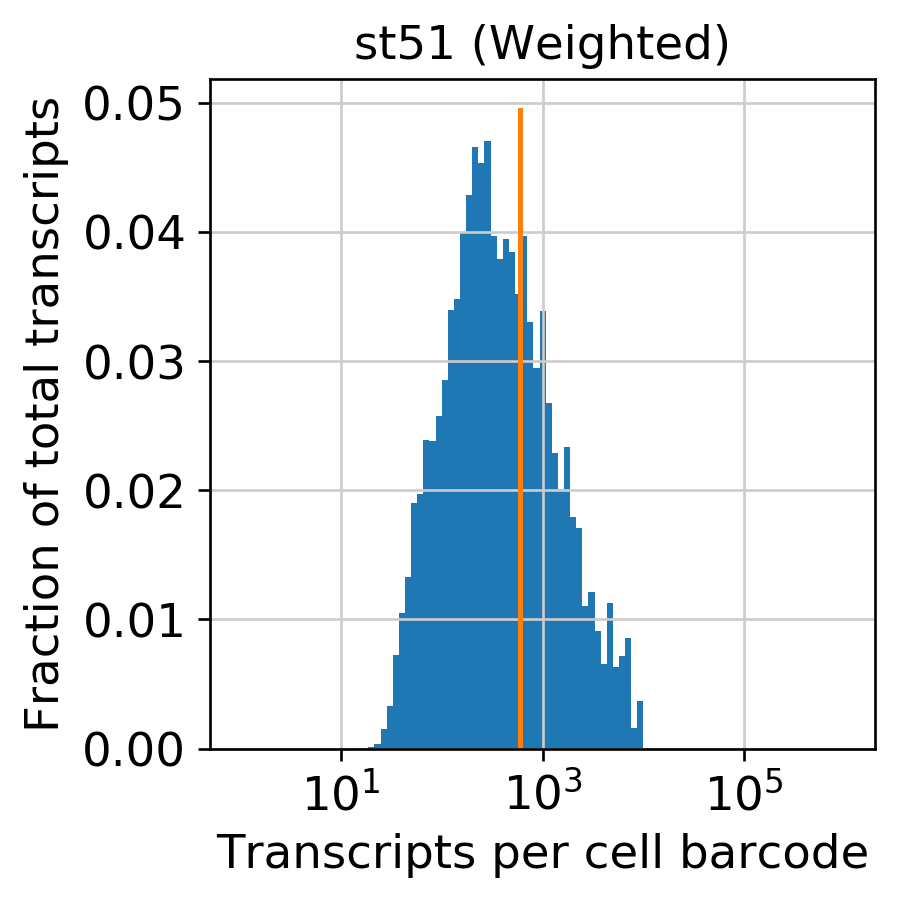

Filtering barcodes for st51  ( 1424 / 25498 )
filtered out 24074 cells that haveless than 600 counts


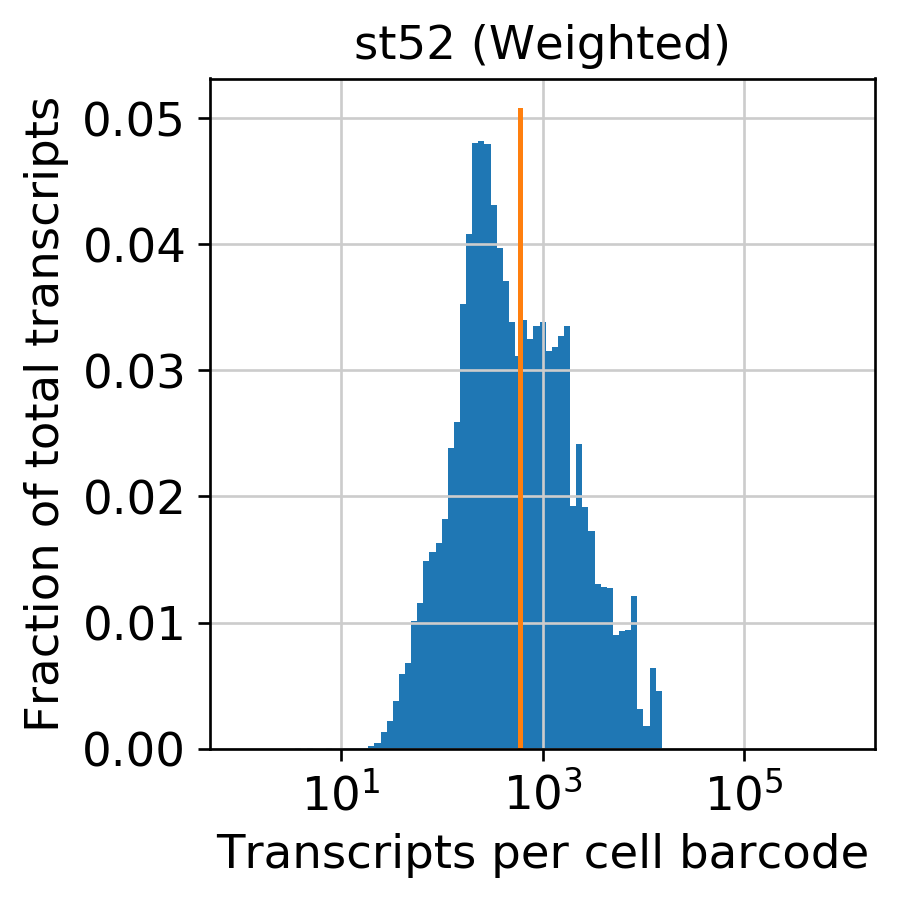

Filtering barcodes for st52  ( 1889 / 22879 )
filtered out 20990 cells that haveless than 600 counts

 AnnData object with n_obs × n_vars = 3313 × 13309 
    obs: 'batch', 'cell_names', 'library_id', 'n_counts', 'unique_cell_id'


In [7]:
# load libraries
#input_path = '/Users/dan/Dropbox (HMS)/Data/inDrops/OP_Oscillations/' # full path to all inDrops datasets
input_path = '/home/pourquielab/Desktop/backup/datachicken/' # full path to all inDrops datasets
libnames_cst5 = ['st51', 'st52']
cst5 = dew.load_inDrops_V3(libnames_cst5, input_path)

# set barcode abundance threshold
cst5['st51']['adata'].uns['counts_thresh'] = 600
cst5['st52']['adata'].uns['counts_thresh'] = 600
#cst5['6s1']['adata'].uns['counts_thresh'] = 350
#cst5['6s2']['adata'].uns['counts_thresh'] = 350
#cst5['35s1']['adata'].uns['counts_thresh'] = 700
#cst5['35s2']['adata'].uns['counts_thresh'] = 700


# perform filtering
for s in libnames_cst5:
    dew.filter_abundant_barcodes(cst5[s]['adata']) # filter and save histogram plots to file
    
# merge all libraries    
cst5 = cst5['st51']['adata'].concatenate(cst5['st52']['adata'],)
print('\n',cst5)

In [8]:
### Add Library Annotations

In [9]:
# Specify timepoints and samples for each library_id
timepoint_dict = {'d3':['st51','st52'],}

sample_dict = {'d3_1':['st51','st52'],}
              

# Invert the dictionaries
timepoint_dict_inv = dict((v,k) for k in timepoint_dict for v in timepoint_dict[k])
sample_dict_inv = dict((v,k) for k in sample_dict for v in sample_dict[k])

# Generate per cell annotations
timepoint_id = []
sample_id = []
for s in cst5.obs['library_id']:
    timepoint_id.append(timepoint_dict_inv[s])
    sample_id.append(sample_dict_inv[s])
cst5.obs['time_id'] = timepoint_id
cst5.obs['sample_id'] = sample_id

In [10]:
### Process & Normalize

In [11]:
# Perform basic filtering
sc.pp.filter_cells(cst5, min_genes=500)
sc.pp.filter_genes(cst5, min_cells=3)

# Optional: exclude unwanted genes from filtered gene list so they 
# don't contribute to the 2-D embedding, clustering, etc.

exclude_genes = ['ND1', 'ND2', 'ND4', 'ATP6', 'CYTB', 'COII', 'COX3', 'COX1','ND5','ND3','ND6'
                ,'RPL10A','RPL12','RPL13','RPL14','RPL15','RPL17','RPL21','RPL22','RPL23','RPL27A',
                 'RPL3','RPL32','RPL36','RPL36AL','RPL38','RPL5','RPL6','RPL7A','RPL9','RPN1','RPS10',
                 'RPS11','RPS14','RPS15','RPS17','RPS19','RPS20','RPS24','RPS25','RPS26','RPS27L',
                 'RPS4X','RPS8','RPSAP58','MRPL10','MRPL16','MRPL17','MRPL18','MRPL2','MRPL24',
                 'MRPL28','MRPL3','MRPL33','MRPL35','MRPL39','MRPL40','MRPL43','MRPL54','MRPL57',
                 'MRPL58','MRPL9','MRPS11','MRPS24','MRPS25','MRPS27','MRPS31','MRPS9','RPL19',
                 'RPL22L1','RPL24','RPL30','RPL34','RPL39','RPL7','RPL7L1','RPLP0','RPLP1','RPLP2',
                 'RPS12','RPS13','RPS21','RPS24','RPS27A','RPS28','RPS3A','RPS4X','RPS6','RPS7',
                 'ITGB1BP3','RPL35A','AKT3','TWNK','MEF2A','SLC25A4']
keep_genes = [g for g in cst5.var_names if g not in exclude_genes]
cst5 = cst5[:, keep_genes]

# Before doing any further processing, store a logarithmized version of the raw data
cst5.raw = sc.pp.log1p(cst5, copy=True)

# Save current n_counts as n_counts_pre_norm
cst5.obs['n_counts_pre_norm'] = cst5.obs['n_counts']

# Perform total counts normalization
sc.pp.normalize_total(cst5)

# Logarithmize the data
sc.pp.log1p(cst5)

# Identify highly variable genes
sc.pp.highly_variable_genes(cst5, n_top_genes=1000)
# Regress out n_counts and percent_mito
sc.pp.regress_out(cst5, ['n_counts_pre_norm'])
sc.pp.regress_out(cst5, ['library_id'])
# Scale the data
sc.pp.scale(cst5)

filtered out 1177 cells that haveless than 500 genes expressed
filtered out 2905 genes that are detectedin less than 3 cells
Normalizing counts per cell.
    finished (0:00:00):normalized adata.X
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
regressing out ['n_counts_pre_norm']
    sparse input is densified and may lead to high memory use


... storing 'cell_names' as categorical
... storing 'library_id' as categorical
... storing 'unique_cell_id' as categorical
... storing 'time_id' as categorical
... storing 'sample_id' as categorical


    finished (0:00:24)
regressing out ['library_id']
    finished (0:00:24)


calculating cell cycle phase
computing score 'S_score'
    finished (0:00:00)
computing score 'G2M_score'
    finished (0:00:00)
-->     'phase', cell cycle phase (adata.obs)
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
    finished (0:00:00)


... storing 'phase' as categorical


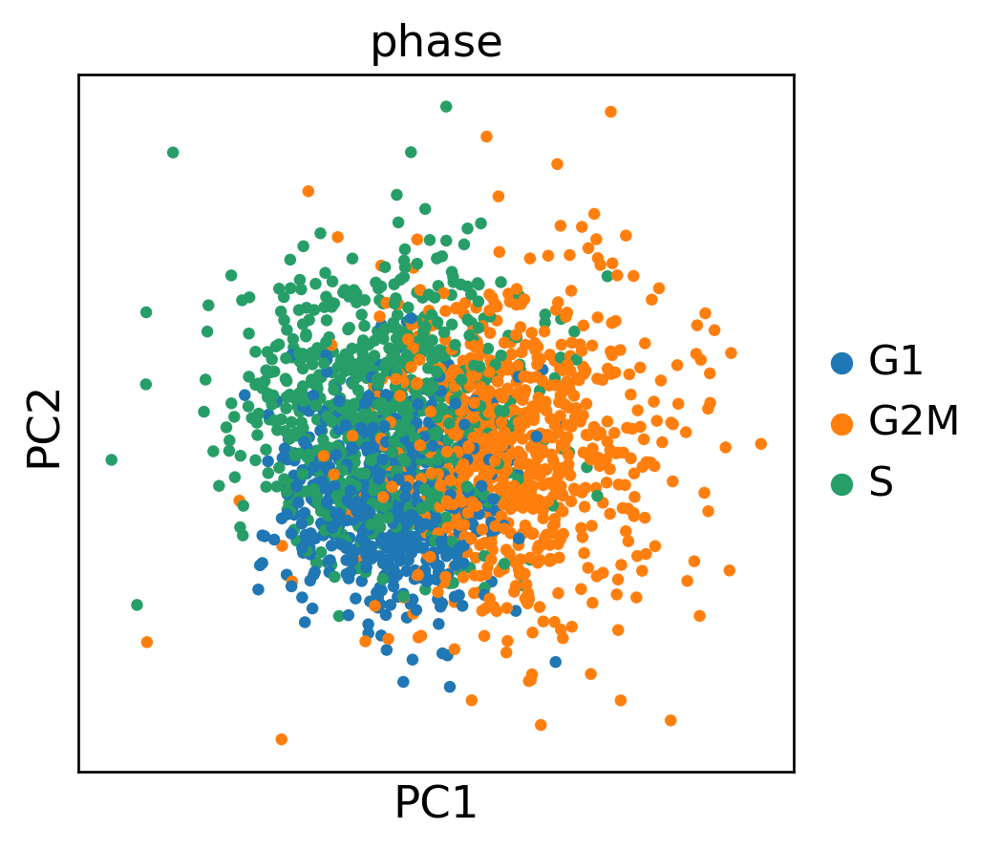

regressing out ['S_score', 'G2M_score']


... storing 'phase' as categorical


    finished (0:00:26)
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
    finished (0:00:00)


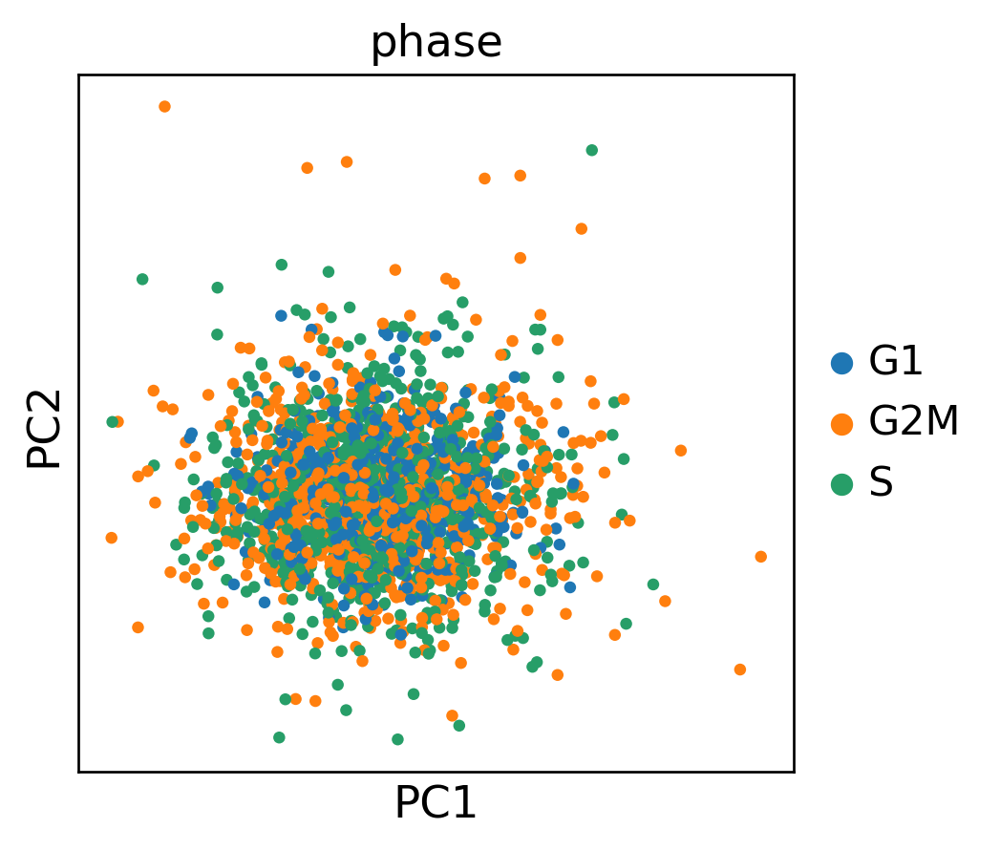

In [12]:
# Need to remove any rows/columns containing all zeros
sc.pp.filter_cells(cst5, min_genes=1)
sc.pp.filter_genes(cst5, min_cells=1)

# Import cell cycle gene list
cell_cycle_genes = [x.strip() for x in open('./regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in cst5.var_names]

# Score cell cycle
sc.tl.score_genes_cell_cycle(cst5, s_genes=s_genes, g2m_genes=g2m_genes)

# Visualize cell cycle PCA trends
cst5_cc_genes = cst5[:, cell_cycle_genes]
sc.tl.pca(cst5_cc_genes, use_highly_variable=False)
sc.pl.pca_scatter(cst5_cc_genes, color='phase')

# Regress out cell cycle
sc.pp.regress_out(cst5, ['S_score', 'G2M_score'])
sc.pp.scale(cst5)

# Visualize cell cycle PCA trends post-regression
cst5_cc_genes = cst5[:, cell_cycle_genes]
sc.tl.pca(cst5_cc_genes, use_highly_variable=False)
sc.pl.pca_scatter(cst5_cc_genes, color='phase')

In [13]:
print('\n',cst5)


 AnnData object with n_obs × n_vars = 2136 × 10311 
    obs: 'batch', 'cell_names', 'library_id', 'n_counts', 'unique_cell_id', 'time_id', 'sample_id', 'n_genes', 'n_counts_pre_norm', 'S_score', 'G2M_score', 'phase'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'


In [14]:
cst5=sc.read('Chicken_stage5_final.h5ad')

In [15]:
### Compute Embeddings

In [16]:
# Perform PCA and construct a batch-balanced neighbor graph
sc.tl.pca(cst5, n_comps=50, )
sc.pp.neighbors(cst5, n_neighbors=7, n_pcs=50, use_rep='X_pca')
dew.export_to_graphml(cst5, filename='Gephi/cst5_bb_st5.graphml')

# Compute sklearn-tSNE and UMAP embeddings
#sc.tl.tsne(cst5, use_fast_tsne=False, random_state=None) #previously 802 now set to 'None' to get a random tSNE embedding
#sc.tl.umap(cst5)


Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00)
computing neighbors
    finished (0:00:02)
IGRAPH U-W- 2136 24860 --
+ attr: weight (e)
+ edges:
   0 --    5    5    9    9   15   15   48   48   64   64  149  149  169  169
179  179  201  201  233  233  239  239  242  242  278  278  322  322  354  354
369  369  376  376  380  380  386  386  418  418  429  429  496  496  557  557
615  615  656  656  673  673  674  674  677  677  710  710  734  734  747  747
771  771  790  790  882  882  896  896  904  904  912  912  931  931  941  941
948  948  949  949  959  959  962  962  973  973  978  978 1046 1046 1057 1057
1110 1110 1119 1119 1151 1151 1175 1175 1265 1265 1318 1318 1344 1344 1364
1364 1370 1370 1393 1393 1433 

computing UMAP
    finished (0:00:04)


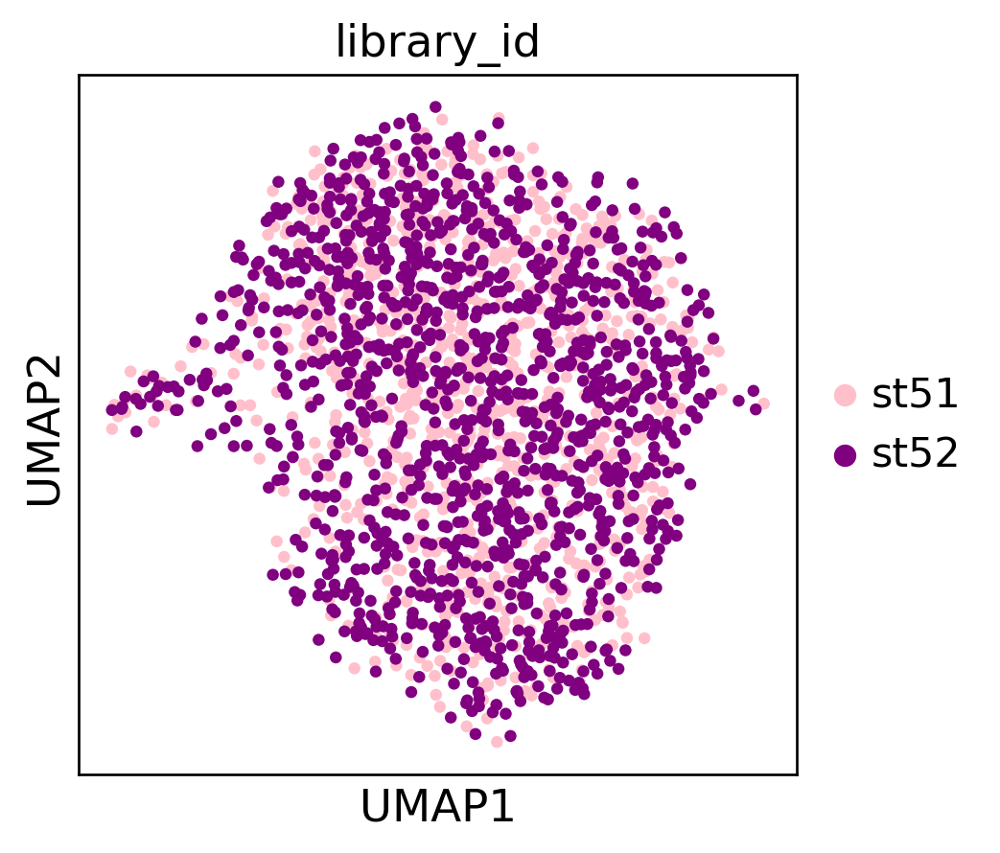

In [17]:
#Compute & plot UMAP
sc.tl.umap(cst5)
sc.pl.umap(cst5, color=['library_id'],palette=['pink','purple',])

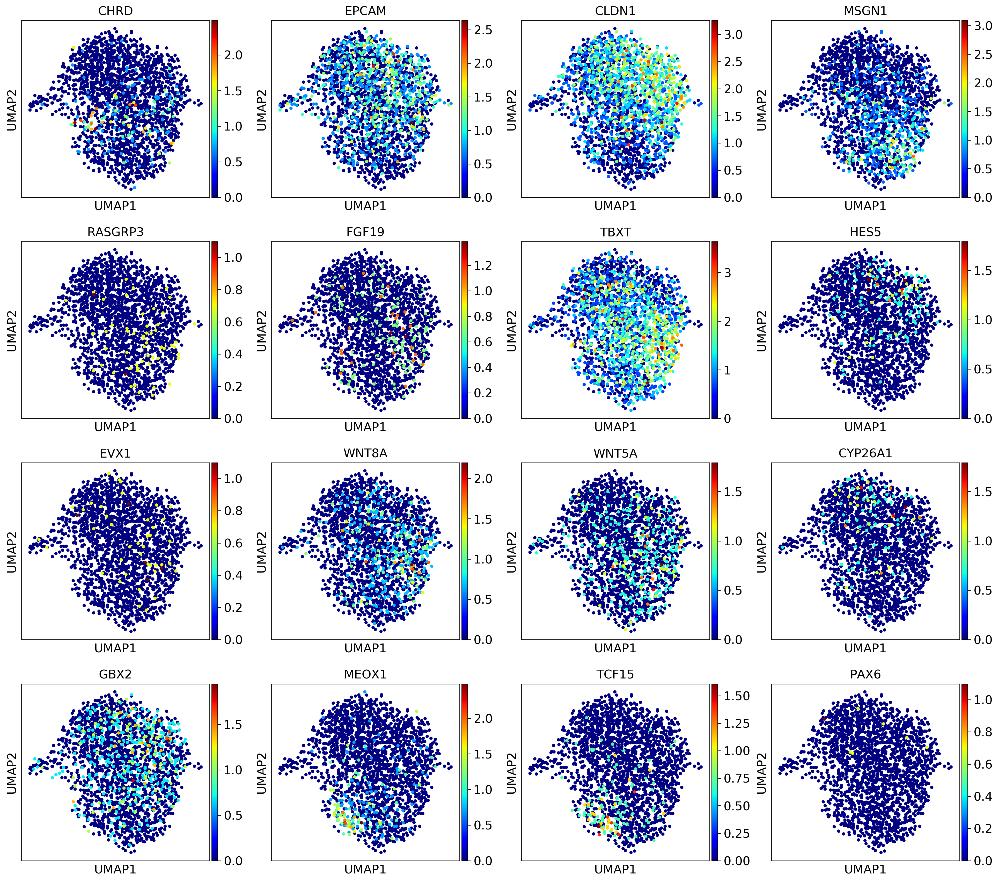

In [18]:
# Overlay genes
sc.pl.umap(cst5, color=['CHRD','EPCAM','CLDN1','MSGN1', 'RASGRP3','FGF19', 'TBXT', 'HES5', 'EVX1','WNT8A','WNT5A','CYP26A1','GBX2','MEOX1','TCF15','PAX6',], cmap='jet')


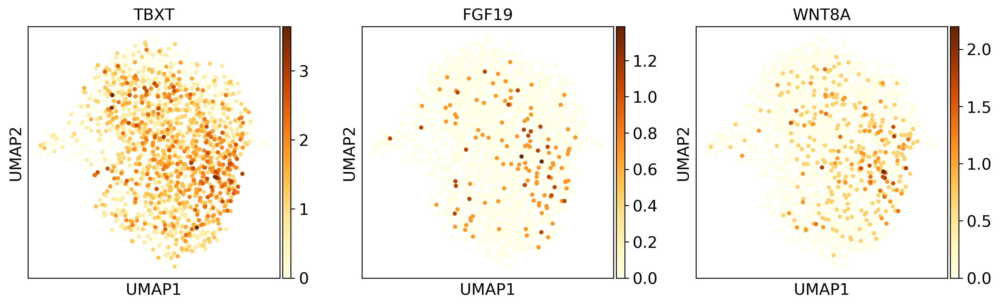

In [19]:
# Overlay genes
sc.pl.umap(cst5, color=['TBXT','FGF19','WNT8A' ], cmap='YlOrBr')

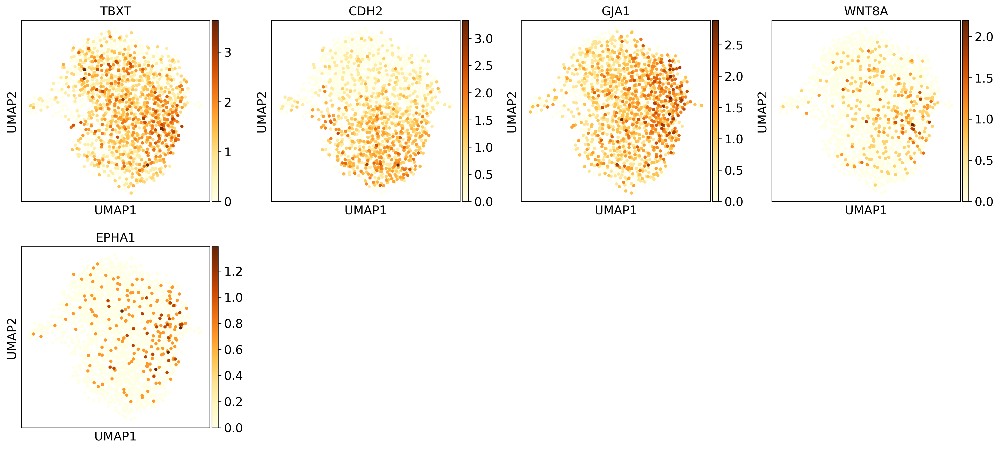

In [20]:
# Overlay genes
sc.pl.umap(cst5, color=['TBXT','CDH2','GJA1','WNT8A','EPHA1' ], cmap='YlOrBr')

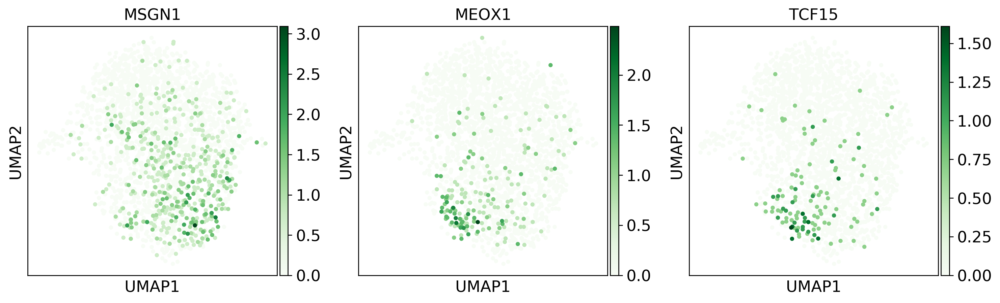

In [21]:
# Overlay genes
sc.pl.umap(cst5, color=['MSGN1','MEOX1', 'TCF15' ], cmap='Greens')

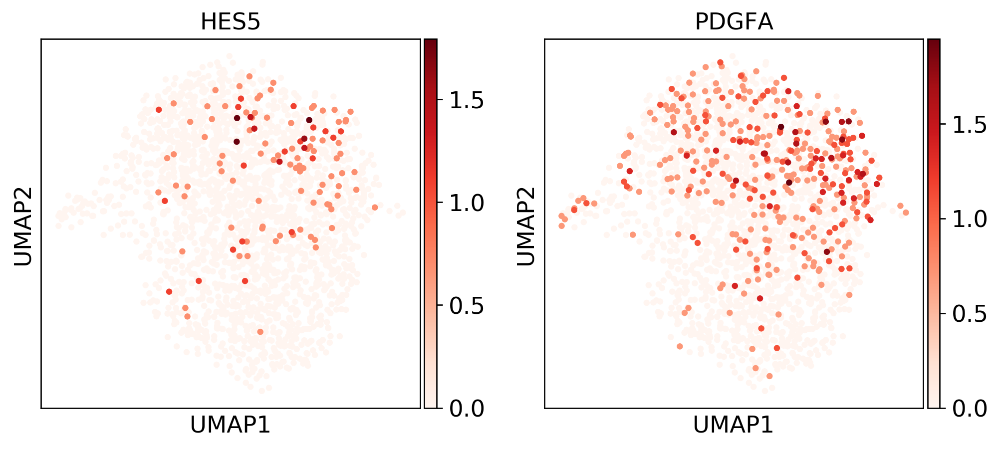

In [22]:
 # Overlay genes
sc.pl.umap(cst5, color=['HES5', 'PDGFA' ], cmap='Reds')

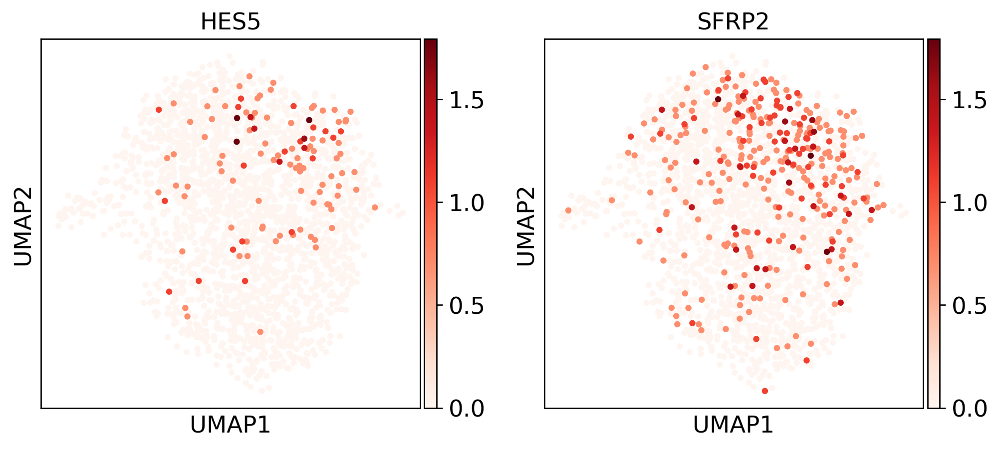

In [23]:
 # Overlay genes
sc.pl.umap(cst5, color=['HES5', 'SFRP2' ], cmap='Reds')

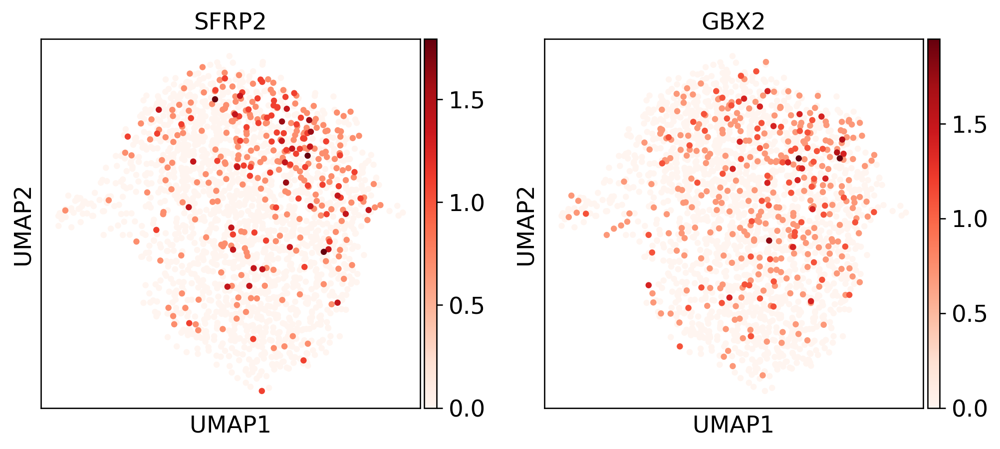

In [24]:
 # Overlay genes
sc.pl.umap(cst5, color=['SFRP2', 'GBX2' ], cmap='Reds')

In [25]:
### Perform Clustering

In [26]:
# Leiden and Louvain clustering

sc.tl.leiden(cst5, resolution=0.755, use_weights=True)

running Leiden clustering
    finished (0:00:00)


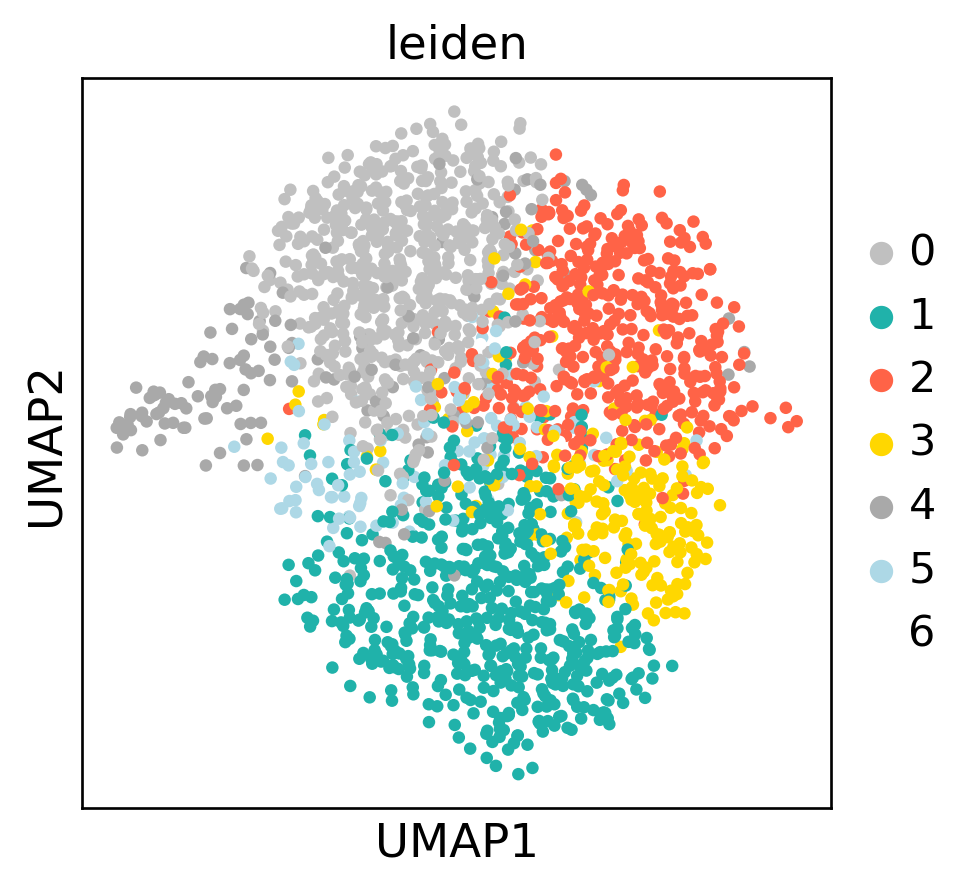

In [49]:
#Plot clusters on UMAP
#sc.pl.umap(cst5, color=['louvain'], palette=[  'lightseagreen', 'orange','royalblue','violet',  'silver','brown', 'darkgreen','lightgreen', 'green','darkblue', 'white', 'white', 'white','white', 'white', 'white','white', 'white',])
sc.pl.umap(cst5, color=['leiden'], palette=['silver','lightseagreen','tomato', 'gold', 'darkgrey','lightblue', 'white', 'white', 'white','white', 'white', 'white','white', 'white',])

ranking genes
    finished (0:00:00)


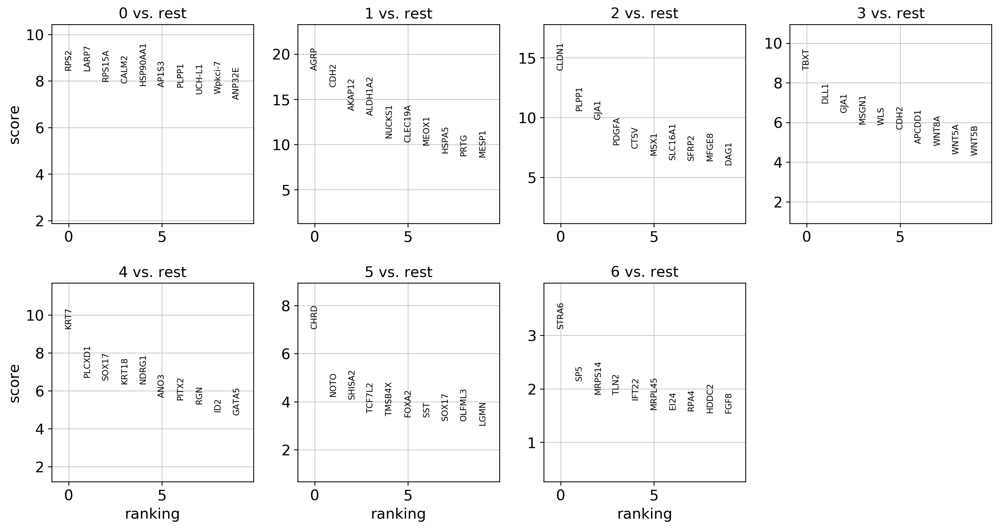

,0,1,2,3,4,5,6
0,RPS2,AGRP,CLDN1,TBXT,KRT7,CHRD,STRA6
1,LARP7,CDH2,PLPP1,DLL1,PLCXD1,NOTO,SP5
2,RPS15A,AKAP12,GJA1,GJA1,SOX17,SHISA2,MRPS14
3,CALM2,ALDH1A2,PDGFA,MSGN1,KRT18,TCF7L2,TLN2
4,HSP90AA1,NUCKS1,CTSV,WLS,NDRG1,TMSB4X,IFT22
5,AP1S3,CLEC19A,MSX1,CDH2,ANO3,FOXA2,MRPL45
6,PLPP1,MEOX1,SLC16A1,APCDD1,PITX2,SST,EI24
7,UCH-L1,HSPA5,SFRP2,WNT8A,RGN,SOX17,RPA4
8,Wpkci-7,PRTG,MFGE8,WNT5A,ID2,OLFML3,HDDC2
9,ANP32E,MESP1,DAG1,WNT5B,GATA5,LGMN,FGF8


In [28]:
# ranking for the highly differential genes in each cluster
sc.tl.rank_genes_groups(cst5, 'leiden', n_genes=1000)
sc.pl.rank_genes_groups(cst5, n_genes=10, sharey=False, save='st5.pdf')
pd.DataFrame(cst5.uns['rank_genes_groups']['names']).head(50)

In [73]:
#save the gene list
Louvain_Cluster=pd.DataFrame(cst5.uns['rank_genes_groups']['names'])
#write the saved gene list to a file
Louvain_Cluster.to_csv('/home/pourquielab/Desktop/backup/datachicken/figures/Leiden_Cluster_st5final.csv')


In [74]:
sc.tl.rank_genes_groups(cst5, 'leiden', use_raw=True, groups='all', reference='rest', n_genes=1000, 
      method='wilcoxon', corr_method='benjamini-hochberg', log_transformed=True)

ranking genes
    finished (0:00:01)


In [75]:
# Generate a tables of differentially expressed genes for each group
deg = cst5.uns['rank_genes_groups']
groups = deg['names'].dtype.names

# Format a table with top 20 gene names only, export to PDFs
for j in range(len(groups)):
    df_names_only = pd.DataFrame({groups : deg[key][groups] for groups in [groups[j]] for key in ['names']}).head(1000)
    html_names_only = df_names_only.style.set_table_styles([{'selector': 'th', 'props': [('font-size', '10pt'), ('font-family','Arial'), ('text-align','center'), ('width', '100px')]}]).set_properties(**{'font-size': '10pt', 'font-family': 'Arial', 'text-align': 'center', 'width': '100px'}).set_precision(3).render()
    with open('tables/tmp.html', 'w') as file: file.write(html_names_only)
   # pdf.from_file('tables/tmp.html', 'tables/cst5_DEGNames_st5_'+groups[j]+'.pdf')

# Format a table with top 100 gene names and corrected p-values, export to excel
df_names_pvals = pd.DataFrame({groups+'_'+key: deg[key][groups] for groups in groups for key in ['names', 'pvals','logfoldchanges']}).head(1000)
df_names_pvals.to_csv('tables/cst5_DEGTable_leiden_st5final.csv')


running PAGA
    finished (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


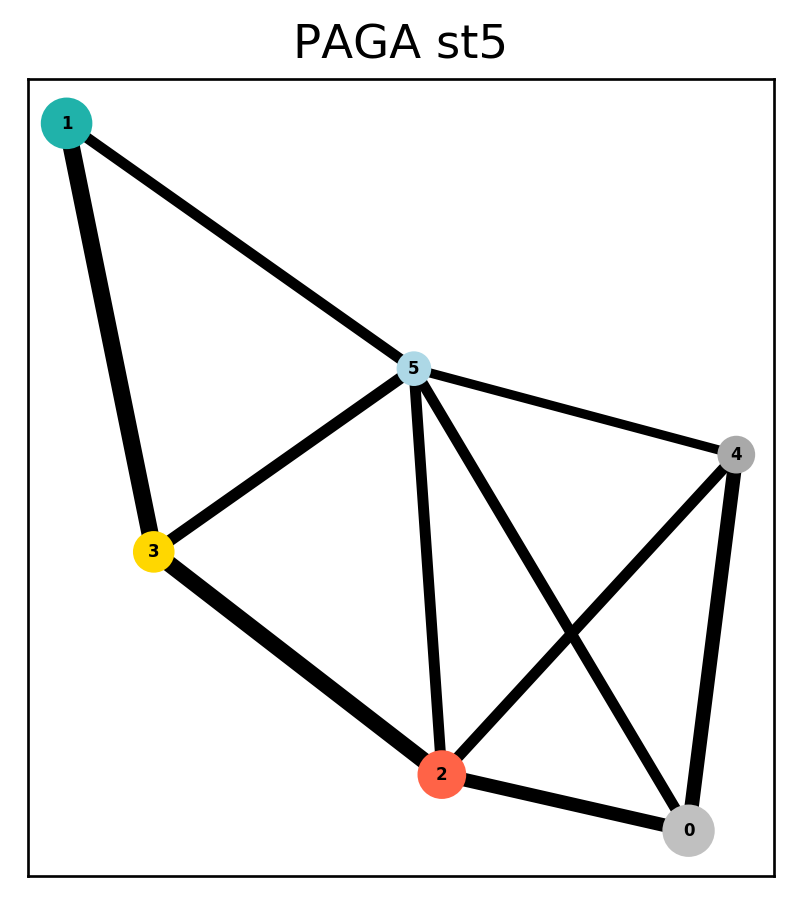

In [52]:
cst5_sub = cst5[~cst5.obs['leiden'].isin(['6','7']),:]
sc.tl.paga(cst5_sub, groups='leiden')
sc.pl.paga(cst5_sub, threshold=0.3, edge_width_scale=1, fontsize=5, show=False, title='PAGA st5')

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9325009  0.8965882  0.8783988  0.8494422  0.8464889
     0.83960056 0.83209777 0.8255335  0.8197666  0.81762224 0.8166693
     0.81153166 0.8052873  0.8047359 ]
    finished (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00)


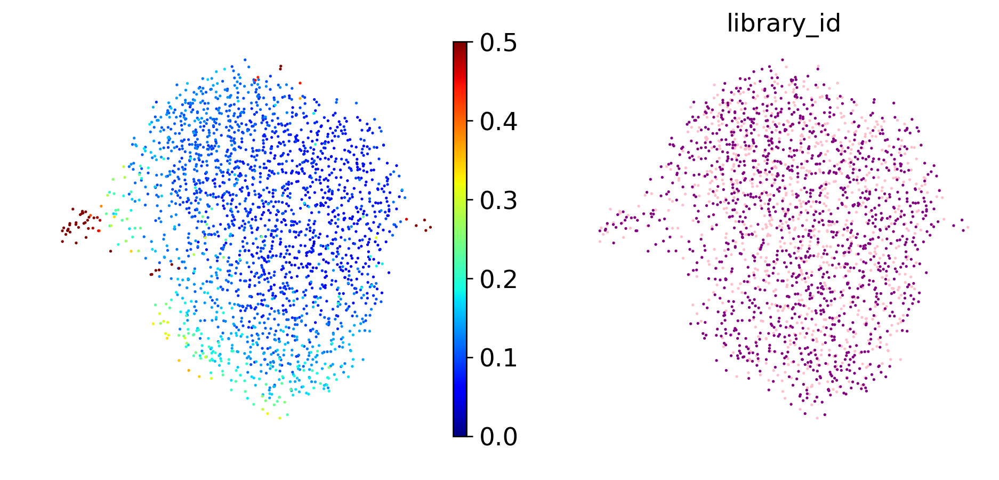

In [53]:

cst5_sub.uns['iroot'] = np.flatnonzero(cst5_sub.obs['leiden']  == '3')[40]
sc.tl.diffmap(cst5_sub,)
sc.tl.dpt(cst5_sub)

# T
sc.pl.umap(cst5_sub, color=['dpt_pseudotime','library_id'], size=10, cmap='jet', edges=False, frameon=False, title='', legend_loc='none', legend_fontsize=10, legend_fontweight='medium', show=False, vmax=0.5)




/home/pourquielab/miniconda2/envs/py6/lib/python3.6/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


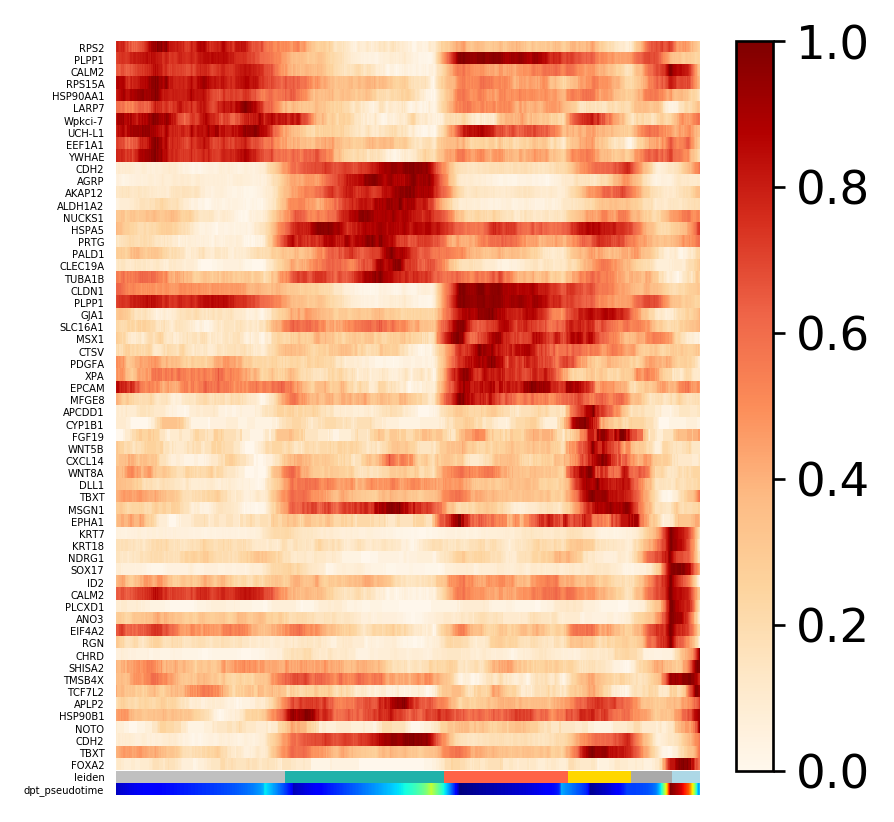

In [79]:
# Plot gene expression trajectories JAM3
traj_nodes = ['0','1','2','3','4','5',]
traj_genes = ['RPS2','PLPP1','CALM2','RPS15A','HSP90AA1','LARP7','Wpkci-7','UCH-L1','EEF1A1','YWHAE','CDH2','AGRP','AKAP12','ALDH1A2','NUCKS1','HSPA5','PRTG','PALD1','CLEC19A','TUBA1B','CLDN1','PLPP1','GJA1','SLC16A1','MSX1','CTSV','PDGFA','XPA','EPCAM','MFGE8','APCDD1','CYP1B1','FGF19','WNT5B','CXCL14','WNT8A','DLL1','TBXT','MSGN1','EPHA1','KRT7','KRT18','NDRG1','SOX17','ID2','CALM2','PLCXD1','ANO3','EIF4A2','RGN','CHRD','SHISA2','TMSB4X','TCF7L2','APLP2','HSP90B1','NOTO','CDH2','TBXT','FOXA2',]
ax = sc.pl.paga_path(cst5_sub, nodes=traj_nodes, keys=traj_genes, use_raw=True, annotations=['dpt_pseudotime'],
                     color_map='OrRd', color_maps_annotations={'dpt_pseudotime': 'jet'}, palette_groups=None, 
                     n_avg=100, groups_key=None, xlim=[None, None], title=None, left_margin=None, ytick_fontsize=3, 
                     title_fontsize=None, show_node_names=False, show_yticks=True, show_colorbar=True, legend_fontsize=1, 
                     legend_fontweight=None, normalize_to_zero_one=True, as_heatmap=True, return_data=False, show=True, ax=None)

#plt.savefig('figures/paga_path_marker_genes.png', dpi=2000, bbox_inches='tight')


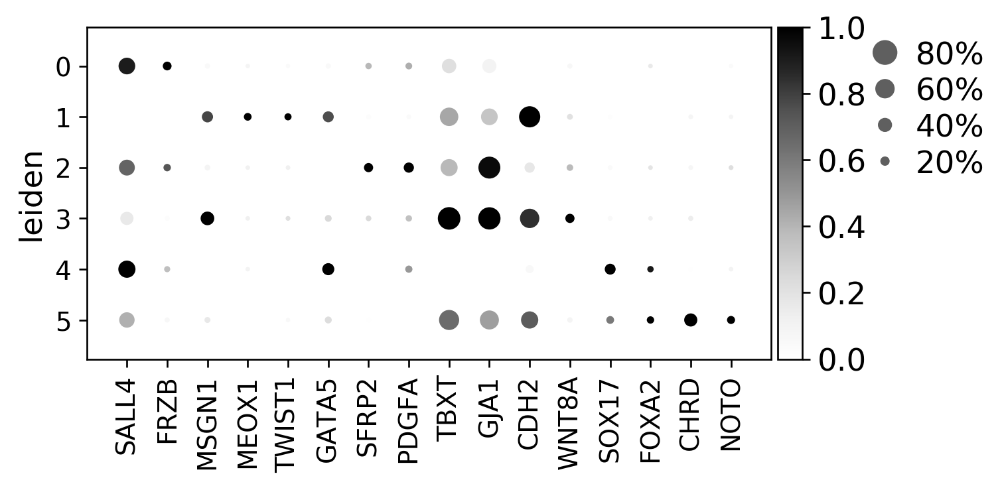

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[5.6, 0, 0.2, 0.5, 0.25])

In [60]:
# Generate Dot Plots
mouse_hox=[ 'SALL4','FRZB','MSGN1','MEOX1','TWIST1','GATA5','SFRP2','PDGFA','TBXT','GJA1', 'CDH2', 'WNT8A','SOX17','FOXA2','CHRD','NOTO',]
# Generate Dot Plots

sc.pl.dotplot(cst5_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

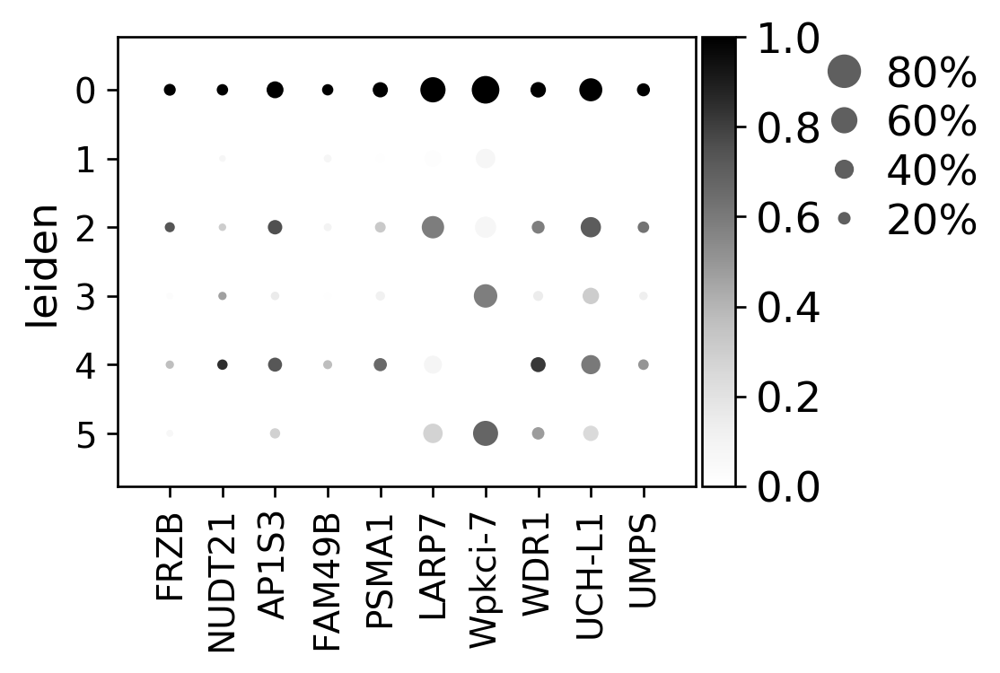

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [61]:
# Generate Dot Plots
mouse_hox=[ 'FRZB','NUDT21','AP1S3','FAM49B','PSMA1','LARP7','Wpkci-7','WDR1','UCH-L1', 'UMPS', ]
# Generate Dot Plots

sc.pl.dotplot(cst5_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

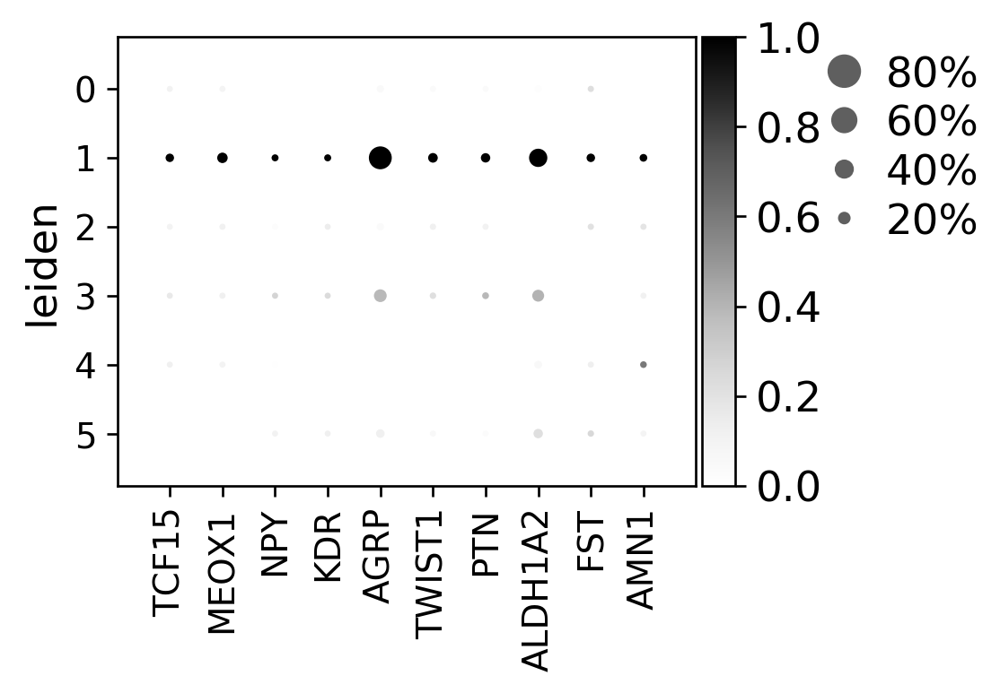

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [62]:
# Generate Dot Plots
mouse_hox=[ 'TCF15','MEOX1','NPY','KDR','AGRP','TWIST1','PTN','ALDH1A2','FST', 'AMN1', ]
# Generate Dot Plots

sc.pl.dotplot(cst5_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

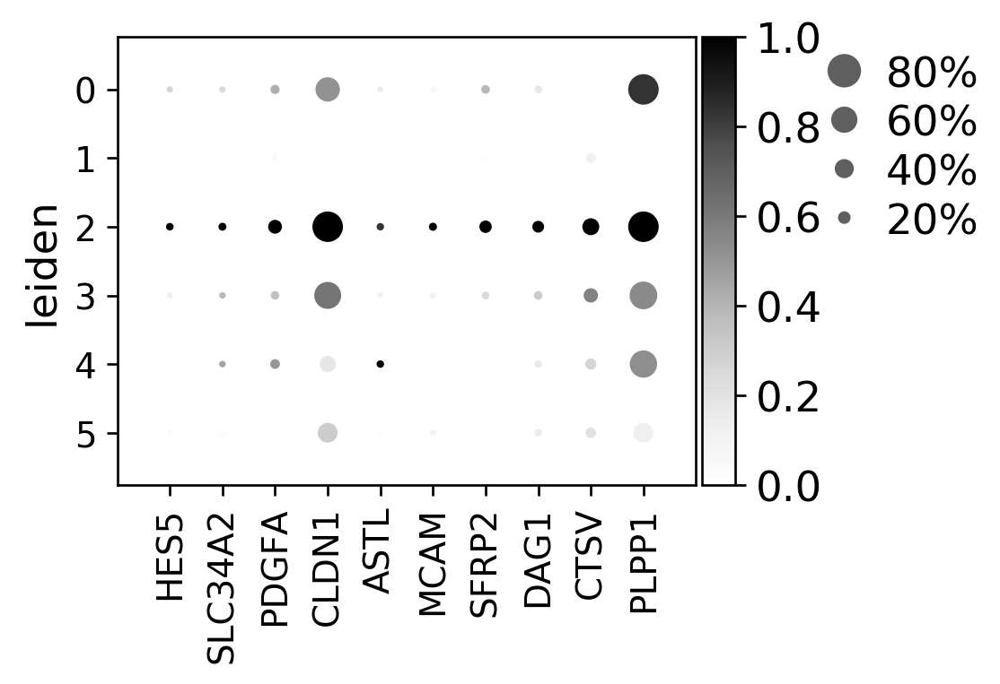

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [63]:
# Generate Dot Plots
mouse_hox=[ 'HES5','SLC34A2','PDGFA','CLDN1','ASTL','MCAM','SFRP2','DAG1','CTSV', 'PLPP1', ]
# Generate Dot Plots

sc.pl.dotplot(cst5_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

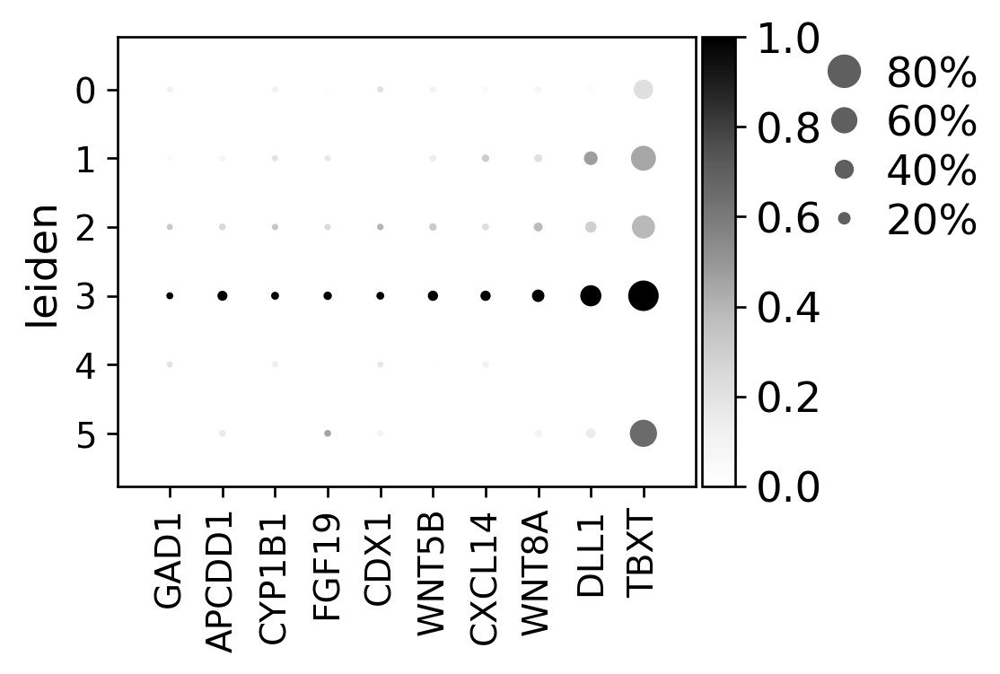

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [64]:
# Generate Dot Plots
mouse_hox=[ 'GAD1','APCDD1','CYP1B1','FGF19','CDX1','WNT5B','CXCL14','WNT8A','DLL1', 'TBXT', ]
# Generate Dot Plots

sc.pl.dotplot(cst5_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

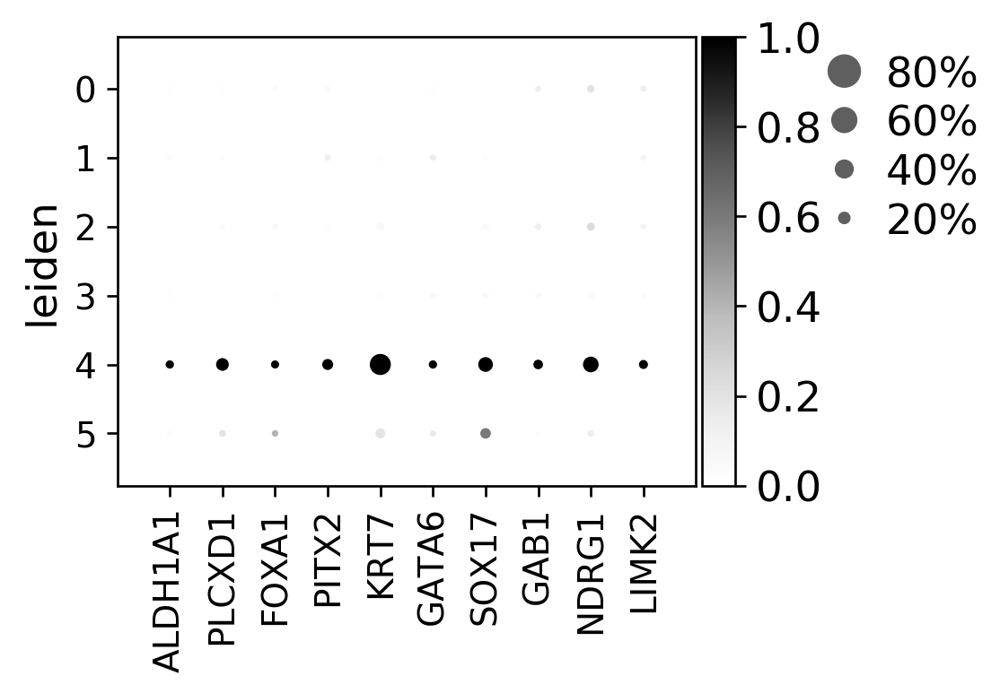

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [65]:
# Generate Dot Plots
mouse_hox=[ 'ALDH1A1','PLCXD1','FOXA1','PITX2','KRT7','GATA6','SOX17','GAB1','NDRG1', 'LIMK2', ]
# Generate Dot Plots

sc.pl.dotplot(cst5_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

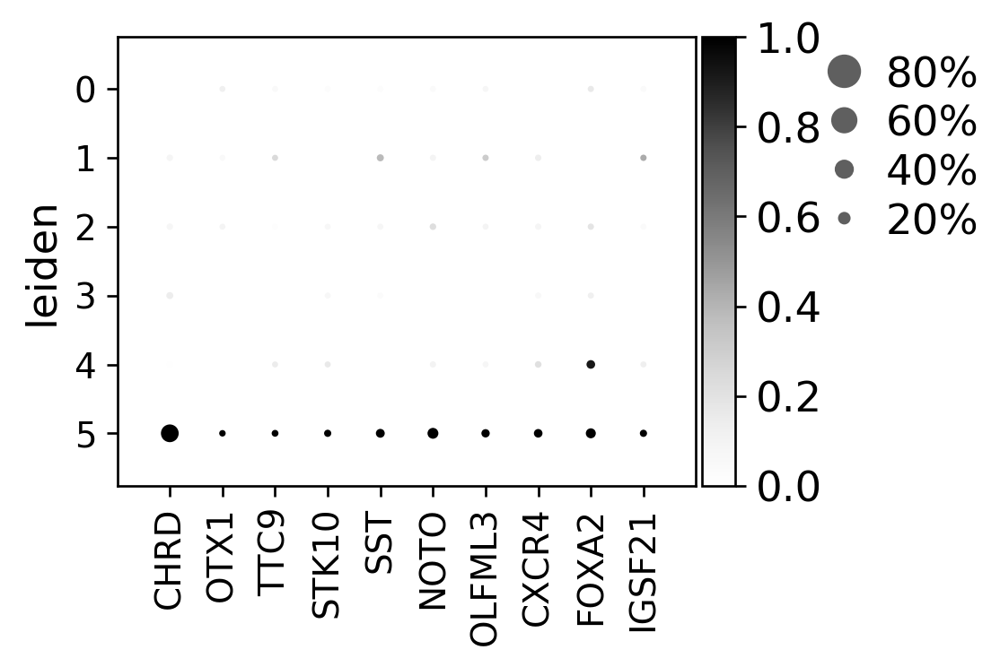

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[3.5, 0, 0.2, 0.5, 0.25])

In [66]:
# Generate Dot Plots
mouse_hox=[ 'CHRD','OTX1','TTC9','STK10','SST','NOTO','OLFML3','CXCR4','FOXA2', 'IGSF21', ]
# Generate Dot Plots

sc.pl.dotplot(cst5_sub, mouse_hox, groupby='leiden',  log=True, num_categories=6, 
              expression_cutoff=0.0,  mean_only_expressed=None, color_map='Greys', dot_max=0.8, 
              dot_min=None, figsize=None, dendrogram=None, gene_symbols=None, var_group_positions=None, 
              standard_scale='var', smallest_dot=4, var_group_labels=None, var_group_rotation=None, 
              layer=None, show=None, save='chicken_NMP_dotplot.png')

In [67]:
cst5.write('Chicken_stage5_final.h5ad')

In [68]:
### Save AnnData DataSet to File

In [69]:
cst5.obs.to_csv('Chicken_stage5_final.csv')
#cst5.write('Chicken_stage5_final.h5ad')

In [70]:
### Load AnnData DataSet from File

In [71]:
cst5 = sc.read('Chicken_stage5_final.h5ad')
print(cst5)

AnnData object with n_obs × n_vars = 2136 × 10311 
    obs: 'batch', 'cell_names', 'library_id', 'n_counts', 'unique_cell_id', 'time_id', 'sample_id', 'n_genes', 'n_counts_pre_norm', 'S_score', 'G2M_score', 'phase', 'leiden'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'leiden', 'leiden_colors', 'library_id_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
